In [1]:
import Pkg
Pkg.activate("../../")

  Activating project at `~/Documents/MPSTime.jl`


In [10]:
using JSON
using Plots
using StatsPlots
using Plots.PlotMeasures
using JLD2

In [11]:
pal = palette(:tab10);

# Load Python Results (CSDI, BRITS, CDREC)

In [12]:
csdi_results = JSON.parsefile("Python/csdi_results.json");
brits_results = JSON.parsefile("Python/brits_results.json");
cdrec_results = JSON.parsefile("Python/cdrec_results.json");

Each dictionary is nested in the following way:
- Fold (1, 2, ..., 29)
    - Percentage missing (5, 15, ..., 95)
        - Window iteration (1, 2, ..., 15)
            - MAE per test instance (1, 2, ..., 100)

Define some functions to extract relevant information:

In [13]:
# per fold, per % missing
function extract_fold_pm(results::Dict, fold_idx::Int, pm::Int)
    """
    Extract errors for a given fold and percentage missing.
    Returns pooled errors across window locations, e.g., for 100 test instances,
    each evaluated for 5% missing data and 15 possible window locations,
    will return 1500 errors once pooled.
    """
    fold_marginalised = results["$fold_idx"]
    pm_marginalised = fold_marginalised["$pm"]
    window_iter_marginalised = [pm_marginalised["$i"] for i in 0:(length(pm_marginalised)-1)]
    # pool together results from all the window locs 
    window_pool = window_iter_marginalised[1]
    for i in 2:length(window_iter_marginalised)
        window_pool = vcat(window_pool, window_iter_marginalised[i])
    end
    return window_pool
end

extract_fold_pm (generic function with 1 method)

# CSDI

In [14]:
per_fold_means_5 = [mean(extract_fold_pm(csdi_results, fold, 5)) for fold in 0:29];
per_fold_stds_5 = [std(extract_fold_pm(csdi_results, fold, 5)) for fold in 0:29];
per_fold_means_35 = [mean(extract_fold_pm(csdi_results, fold, 35)) for fold in 0:29];
per_fold_stds_35 = [std(extract_fold_pm(csdi_results, fold, 35)) for fold in 0:29];
per_fold_means_65 = [mean(extract_fold_pm(csdi_results, fold, 65)) for fold in 0:29];
per_fold_stds_65 = [std(extract_fold_pm(csdi_results, fold, 65)) for fold in 0:29];
per_fold_means_95 = [mean(extract_fold_pm(csdi_results, fold, 95)) for fold in 0:29];
per_fold_stds_95 = [std(extract_fold_pm(csdi_results, fold, 95)) for fold in 0:29];

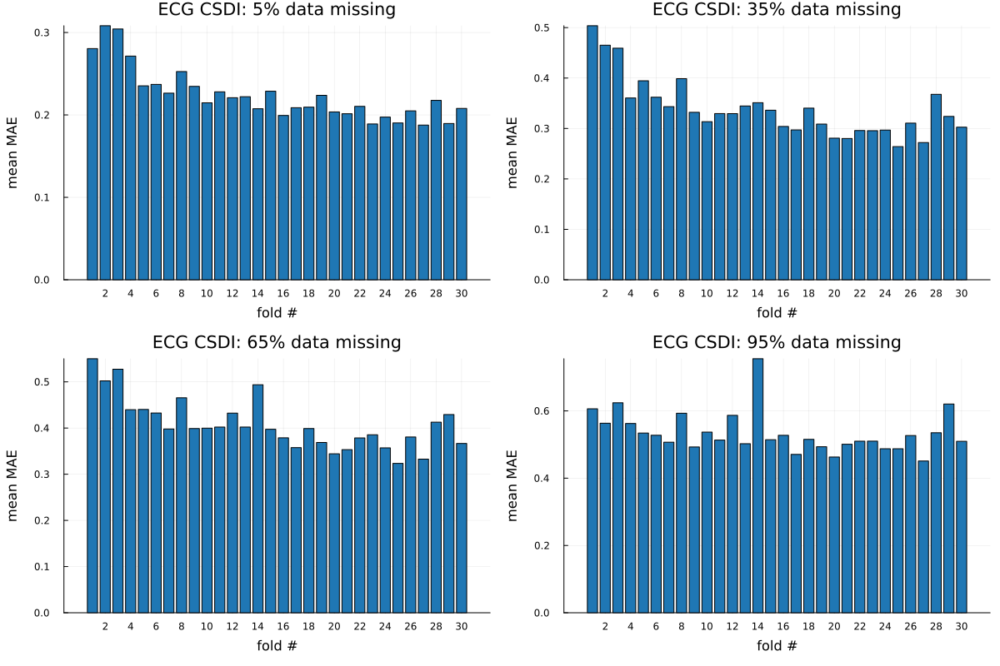

In [15]:
p1 = bar(collect(1:30), per_fold_means_5, legend=:none, xlabel="fold #",
    ylabel="mean MAE", title="ECG CSDI: 5% data missing", c=pal[1],
    xticks=collect(2:2:30))
p2 = bar(collect(1:30), per_fold_means_35, legend=:none, xlabel="fold #",
    ylabel="mean MAE", title="ECG CSDI: 35% data missing", c=pal[1],
    xticks=collect(2:2:30))
p3 = bar(collect(1:30), per_fold_means_65, legend=:none, xlabel="fold #",
    ylabel="mean MAE", title="ECG CSDI: 65% data missing", c=pal[1],
    xticks=collect(2:2:30))
p4 = bar(collect(1:30), per_fold_means_95, legend=:none, xlabel="fold #",
    ylabel="mean MAE", title="ECG CSDI: 95% data missing", c=pal[1],
    xticks=collect(2:2:30))
plot(p1, p2, p3, p4, size=(1200, 800), bottom_margin=5mm, left_margin=5mm)

Mean across folds per % data missing:

In [16]:
csdi_mean_per_pm = [mean([mean(extract_fold_pm(csdi_results, fold, pm)) for fold in 0:29]) for pm in 5:10:95]
# standard error
csdi_std_err_per_pm = [std([mean(extract_fold_pm(csdi_results, fold, pm)) for fold in 0:29]) for pm in 5:10:95]/sqrt(30)
# 95 CI
csdi_ci95_per_pm = 1.96 * csdi_std_err_per_pm;

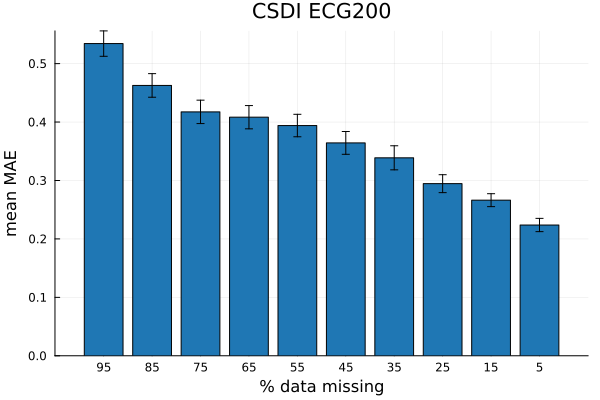

In [17]:
bar(csdi_mean_per_pm, yerr=csdi_ci95_per_pm, 
    xlabel="% data missing", label="", ylabel="mean MAE",
    xticks=([1, 2, 3, 4, 5, 6, 7, 8, 9, 10], 
    ["5", "15", "25", "35", "45", "55", "65", "75", "85", "95"]),
    title="CSDI ECG200", c=pal[1])
xflip!(true)
#savefig("csdi_ecg200_pm.svg")

# BRITS

In [18]:
br_per_fold_means_5 = [mean(extract_fold_pm(brits_results, fold, 5)) for fold in 0:29];
br_per_fold_stds_5 = [std(extract_fold_pm(brits_results, fold, 5)) for fold in 0:29];
br_per_fold_means_35 = [mean(extract_fold_pm(brits_results, fold, 35)) for fold in 0:29];
br_per_fold_stds_35 = [std(extract_fold_pm(brits_results, fold, 35)) for fold in 0:29];
br_per_fold_means_65 = [mean(extract_fold_pm(brits_results, fold, 65)) for fold in 0:29];
br_per_fold_stds_65 = [std(extract_fold_pm(brits_results, fold, 65)) for fold in 0:29];
br_per_fold_means_95 = [mean(extract_fold_pm(brits_results, fold, 95)) for fold in 0:29];
br_per_fold_stds_95 = [std(extract_fold_pm(brits_results, fold, 95)) for fold in 0:29];

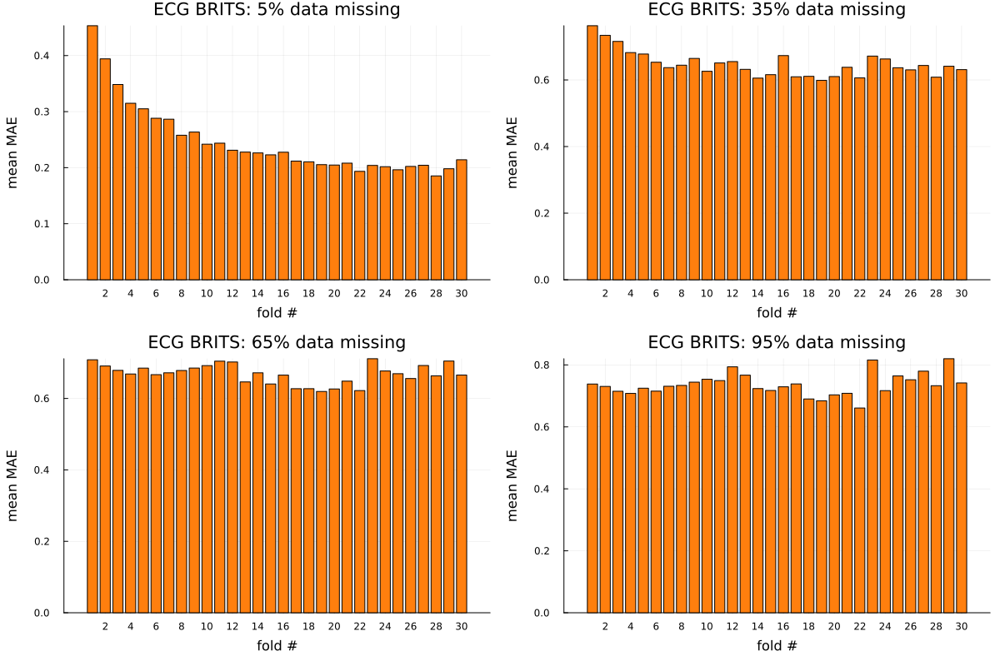

In [19]:
p1 = bar(collect(1:30), br_per_fold_means_5, legend=:none, xlabel="fold #",
    ylabel="mean MAE", title="ECG BRITS: 5% data missing", c=pal[2],
    xticks=collect(2:2:30))
p2 = bar(collect(1:30), br_per_fold_means_35, legend=:none, xlabel="fold #",
    ylabel="mean MAE", title="ECG BRITS: 35% data missing", c=pal[2],
    xticks=collect(2:2:30))
p3 = bar(collect(1:30), br_per_fold_means_65, legend=:none, xlabel="fold #",
    ylabel="mean MAE", title="ECG BRITS: 65% data missing", c=pal[2],
    xticks=collect(2:2:30))
p4 = bar(collect(1:30), br_per_fold_means_95, legend=:none, xlabel="fold #",
    ylabel="mean MAE", title="ECG BRITS: 95% data missing", c=pal[2],
    xticks=collect(2:2:30))
plot(p1, p2, p3, p4, size=(1200, 800), bottom_margin=5mm, left_margin=5mm)

In [20]:
brits_mean_per_pm = [mean([mean(extract_fold_pm(brits_results, fold, pm)) for fold in 0:29]) for pm in 5:10:95]
# standard error
brits_std_err_per_pm = [std([mean(extract_fold_pm(brits_results, fold, pm)) for fold in 0:29]) for pm in 5:10:95]/sqrt(30)
# 95 CI
brits_ci95_per_pm = 1.96 * brits_std_err_per_pm;

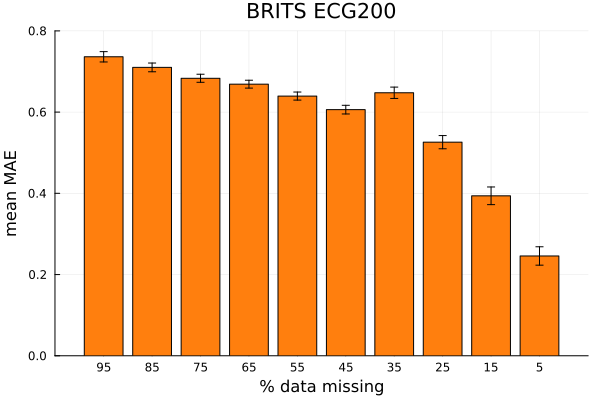

In [21]:
bar(brits_mean_per_pm, yerr=brits_ci95_per_pm, 
    xlabel="% data missing", label="", ylabel="mean MAE",
    xticks=([1, 2, 3, 4, 5, 6, 7, 8, 9, 10], 
    ["5", "15", "25", "35", "45", "55", "65", "75", "85", "95"]),
    title="BRITS ECG200", c=pal[2],
    ylims=(0, 0.8))
xflip!(true)
#savefig("brits_ecg200_pm.svg")

# CDREC

In [22]:
cd_per_fold_means_5 = [mean(extract_fold_pm(cdrec_results, fold, 5)) for fold in 0:29];
cd_per_fold_stds_5 = [std(extract_fold_pm(cdrec_results, fold, 5)) for fold in 0:29];
cd_per_fold_means_35 = [mean(extract_fold_pm(cdrec_results, fold, 35)) for fold in 0:29];
cd_per_fold_stds_35 = [std(extract_fold_pm(cdrec_results, fold, 35)) for fold in 0:29];
cd_per_fold_means_65 = [mean(extract_fold_pm(cdrec_results, fold, 65)) for fold in 0:29];
cd_per_fold_stds_65 = [std(extract_fold_pm(cdrec_results, fold, 65)) for fold in 0:29];
cd_per_fold_means_95 = [mean(extract_fold_pm(cdrec_results, fold, 95)) for fold in 0:29];
cd_per_fold_stds_95 = [std(extract_fold_pm(cdrec_results, fold, 95)) for fold in 0:29];

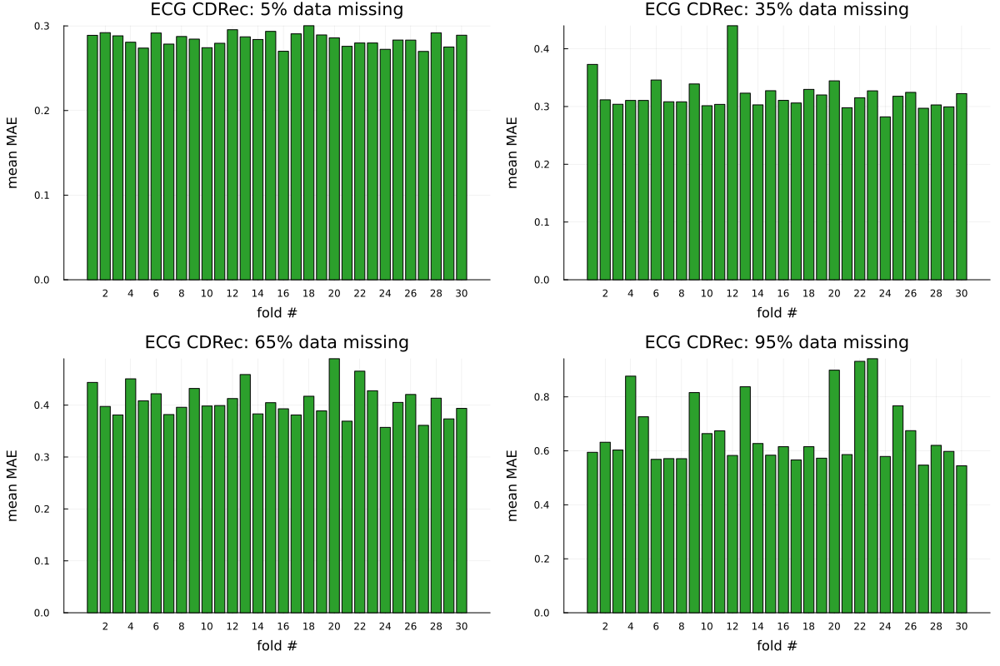

In [23]:
p1 = bar(collect(1:30), cd_per_fold_means_5, legend=:none, xlabel="fold #",
    ylabel="mean MAE", title="ECG CDRec: 5% data missing", c=pal[3],
    xticks=collect(2:2:30))
p2 = bar(collect(1:30), cd_per_fold_means_35, legend=:none, xlabel="fold #",
    ylabel="mean MAE", title="ECG CDRec: 35% data missing", c=pal[3],
    xticks=collect(2:2:30))
p3 = bar(collect(1:30), cd_per_fold_means_65, legend=:none, xlabel="fold #",
    ylabel="mean MAE", title="ECG CDRec: 65% data missing", c=pal[3],
    xticks=collect(2:2:30))
p4 = bar(collect(1:30), cd_per_fold_means_95, legend=:none, xlabel="fold #",
    ylabel="mean MAE", title="ECG CDRec: 95% data missing", c=pal[3],
    xticks=collect(2:2:30))
plot(p1, p2, p3, p4, size=(1200, 800), bottom_margin=5mm, left_margin=5mm)

In [24]:
cdrec_mean_per_pm = [mean([mean(extract_fold_pm(cdrec_results, fold, pm)) for fold in 0:29]) for pm in 5:10:95]
# standard error
cdrec_std_err_per_pm = [std([mean(extract_fold_pm(cdrec_results, fold, pm)) for fold in 0:29]) for pm in 5:10:95]/sqrt(30)
# 95 CI
cdrec_ci95_per_pm = 1.96 * cdrec_std_err_per_pm;

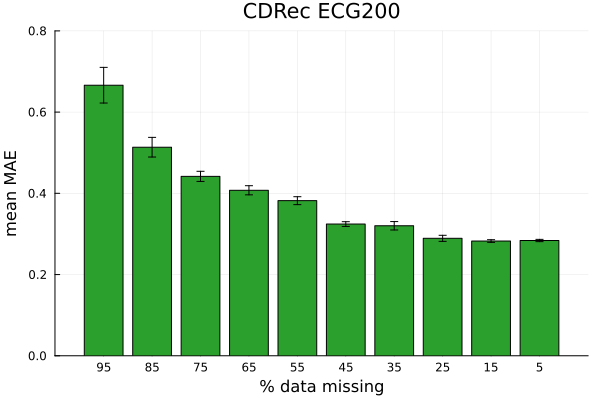

In [25]:
bar(cdrec_mean_per_pm, yerr=cdrec_ci95_per_pm, 
    xlabel="% data missing", label="", ylabel="mean MAE",
    xticks=([1, 2, 3, 4, 5, 6, 7, 8, 9, 10], 
    ["5", "15", "25", "35", "45", "55", "65", "75", "85", "95"]),
    title="CDRec ECG200", c=pal[3],
    ylims=(0, 0.8))
xflip!(true)
#savefig("cdrec_ecg200_pm.svg")

# Combined Results

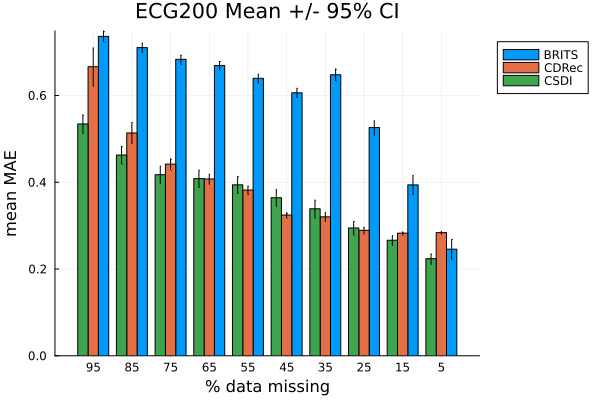

In [26]:
groupedbar([brits_mean_per_pm cdrec_mean_per_pm csdi_mean_per_pm ],
    yerr=[brits_ci95_per_pm cdrec_ci95_per_pm csdi_ci95_per_pm],
    markersize=0,
    legend=:outertopright, 
    xticks=([1, 2, 3, 4, 5, 6, 7, 8, 9, 10], 
    ["5", "15", "25", "35", "45", "55", "65", "75", "85", "95"]),
    label=["BRITS" "CDRec" "CSDI"], 
    title="ECG200 Mean +/- 95% CI",
    xlabel="% data missing",
    ylabel="mean MAE")
xflip!(true)
#savefig("combined_imputers.svg")

# Load Julia Results (MPS/NN)

In [ ]:
# f = jldopen("Julia/ecg_benchmark_trial.jld2", "r");
# per_fold_mps = read(f, "per_fold_mps")
# per_fold_nn = read(f, "per_fold_nn")
# close(f)

┌ Warning: Opening file with JLD2.MmapIO failed, falling back to IOStream
└ @ JLD2 /Users/jmoo2880/.julia/packages/JLD2/OP0XX/src/JLD2.jl:175


SystemError: SystemError: opening file "Julia/ecg_benchmark_trial.jld2": No such file or directory

define functions to extract results

In [28]:
function extract_fold_pm_jl(results, fold_idx, pm)
    pm_to_idx = Dict(5 => 1, 15 => 2, 25 => 3, 35 => 4, 45 => 5, 55 => 6, 65 => 7, 75 => 9, 85 => 9, 95 => 10)
    # same functionality as extract_fold_pm but for julia results 
    fold_marginalised = results[fold_idx]
    pm_marginalised = [fold_marginalised[instance][pm_to_idx[pm]] for instance in 1:length(fold_marginalised)]
    # pool together result for all instances
    pooled = pm_marginalised[1]
    for i in 2:length(pm_marginalised)
        pooled = vcat(pooled, pm_marginalised[i])
    end
    return pooled
end

extract_fold_pm_jl (generic function with 1 method)

In [29]:
nn_mean_per_pm = [mean([mean(extract_fold_pm_jl(per_fold_nn, fold, pm)) for fold in 1:30]) for pm in 5:10:95]
nn_std_per_pm = [std([mean(extract_fold_pm_jl(per_fold_nn, fold, pm)) for fold in 1:30]) for pm in 5:10:95]/sqrt(30)
nn_ci95_per_pm = 1.96 * nn_std_per_pm;

UndefVarError: UndefVarError: `per_fold_nn` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [23]:
mps_mean_per_pm = [mean([mean(extract_fold_pm_jl(per_fold_mps, fold, pm)) for fold in 1:30]) for pm in 5:10:95]
mps_std_per_pm = [std([mean(extract_fold_pm_jl(per_fold_mps, fold, pm)) for fold in 1:30]) for pm in 5:10:95]/sqrt(30)
mps_ci95_per_pm = 1.96 * mps_std_per_pm;

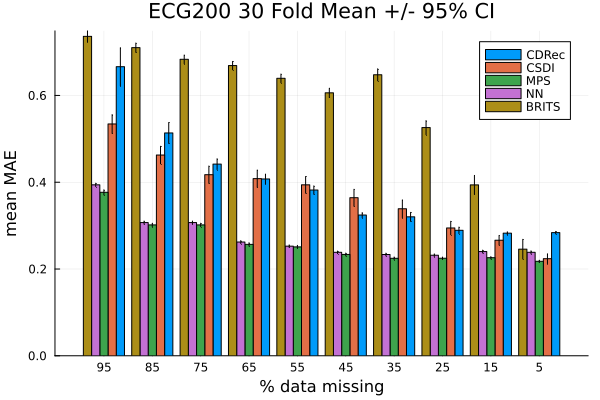

In [24]:
groupedbar([cdrec_mean_per_pm csdi_mean_per_pm mps_mean_per_pm nn_mean_per_pm brits_mean_per_pm],
    yerr=[cdrec_ci95_per_pm csdi_ci95_per_pm mps_ci95_per_pm nn_ci95_per_pm brits_ci95_per_pm],
    markersize=0, 
    legend=:topright,
    bar_width=0.85,
    xticks=([1, 2, 3, 4, 5, 6, 7, 8, 9, 10], 
    ["5", "15", "25", "35", "45", "55", "65", "75", "85", "95"]),
    label=["CDRec" "CSDI" "MPS" "NN" "BRITS"], 
    title="ECG200 30 Fold Mean +/- 95% CI",
    xlabel="% data missing",
    ylabel="mean MAE")
xflip!(true)
#savefig("combined_imputers_all.svg")

-----

# Second Run (Latest Imputation Alg)

In [ ]:
# f_results_mac = jldopen("Julia/ecg_30_fold_imputation_results_mac5sweep.jld2", "r");
# f_results_linux = jldopen("Julia/ecg_30_fold_imputation_results_linux5sweep.jld2", "r");
# mps_opts_mac = read(f_results_mac, "opts_safe");
# mps_results_mac = read(f_results_mac, "results")
# mps_results_linux = read(f_results_linux, "results")

┌ Warning: type Main.Options does not exist in workspace; reconstructing
└ @ JLD2 /Users/jmoo2880/.julia/packages/JLD2/OP0XX/src/data/reconstructing_datatypes.jl:622
┌ Warning: type Main.BBOpt does not exist in workspace; reconstructing
└ @ JLD2 /Users/jmoo2880/.julia/packages/JLD2/OP0XX/src/data/reconstructing_datatypes.jl:622
┌ Warning: type Main.Loss_Grad_KLD does not exist in workspace; reconstructing
└ @ JLD2 /Users/jmoo2880/.julia/packages/JLD2/OP0XX/src/data/reconstructing_datatypes.jl:489
┌ Warning: type Main.Basis does not exist in workspace; reconstructing
└ @ JLD2 /Users/jmoo2880/.julia/packages/JLD2/OP0XX/src/data/reconstructing_datatypes.jl:622
┌ Warning: type Main.#legendre_encode_no_norm does not exist in workspace; reconstructing
└ @ JLD2 /Users/jmoo2880/.julia/packages/JLD2/OP0XX/src/data/reconstructing_datatypes.jl:489
┌ Warning: type Main.FoldResults does not exist in workspace; interpreting Array{Main.FoldResults} as Array{Any}
└ @ JLD2 /Users/jmoo2880/.julia/packag

30-element Vector{Any}:
 Reconstruct@FoldResults(Any[Any[Reconstruct@InstanceScores(Any[Any[Reconstruct@WindowScores(Any[[0.04675075925000025, 0.059257778000000406, 0.04364071025000038, 0.19686928300000034, 0.04581114725000002, 0.17789322799999968, 0.20286730975000017, 0.13700476424999986, 0.040609465000000136, 0.1622879295000005, 0.4182726332500001, 0.14005119060000024, 0.15818581624999992, 0.20745588200000054, 0.6627833092500008], [0.15299745599999998, 0.0911690012, 0.1096171752, 0.17567522399999996, 0.3937973, 0.2240732364, 0.47939262239999997, 0.3358888704, 0.19607270000000004, 0.057764300000000005, 0.3482592299999999, 0.2645365476, 0.42294685239999996, 0.045841168, 0.718917392]]), Reconstruct@WindowScores(Any[[0.34363754991071443, 0.3183676318749997, 0.2052613850357145, 0.15935267071428624, 0.38553933053571443, 0.6585278684821428, 0.1909167843749999, 0.1436576765178574, 0.6594087920535712, 0.2043807834821429, 0.1409162090535715, 0.3546511901785712, 0.1475791896785715, 0.1648048077

In [ ]:
# mps_results = Dict()
# nn_results = Dict()
# for pm in 1:10
#     per_pm_res_mps = Dict()
#     per_pm_res_nn = Dict()
#     for f in 1:30
#         per_pm_res_mps[f] = [mps_results_mac[f].fold_scores[inst].pm_scores[pm].mps_scores for inst in 1:100]
#         per_pm_res_nn[f] = [mps_results_mac[f].fold_scores[inst].pm_scores[pm].nn_scores for inst in 1:100]
#     end
#     mps_results[pm] = per_pm_res_mps
#     nn_results[pm] = per_pm_res_nn
# end
# mps_results
# nn_results

Dict{Any, Any} with 10 entries:
  5  => Dict{Any, Any}(5=>[[0.816229, 0.716789, 0.494389, 0.487845, 0.410513, 0…
  4  => Dict{Any, Any}(5=>[[0.512197, 0.73115, 0.824906, 0.344873, 0.798693, 0.…
  6  => Dict{Any, Any}(5=>[[0.742958, 0.712691, 0.596406, 0.739395, 0.484134, 0…
  7  => Dict{Any, Any}(5=>[[0.664012, 0.667855, 0.666177, 0.68024, 0.664046, 1.…
  2  => Dict{Any, Any}(5=>[[0.263445, 0.23585, 0.594918, 0.452408, 0.226465, 0.…
  10 => Dict{Any, Any}(5=>[[0.53627, 0.80418, 0.819151, 0.639092, 0.875623], [0…
  9  => Dict{Any, Any}(5=>[[0.575912, 0.935851, 0.569942, 0.805661, 0.554979, 0…
  8  => Dict{Any, Any}(5=>[[0.60876, 0.618398, 1.02255, 1.01797, 0.610427, 0.59…
  3  => Dict{Any, Any}(5=>[[0.568246, 0.677104, 0.656396, 0.253046, 0.919246, 0…
  1  => Dict{Any, Any}(5=>[[1.1788, 0.165967, 0.153152, 0.225104, 1.03171, 0.24…

In [ ]:
# mps_results_lin = Dict()
# nn_results_lin = Dict()
# for pm in 1:10
#     per_pm_res_mps_lin = Dict()
#     per_pm_res_nn_lin = Dict()
#     for f in 1:30
#         per_pm_res_mps_lin[f] = [mps_results_linux[f].fold_scores[inst].pm_scores[pm].mps_scores for inst in 1:100]
#         per_pm_res_nn_lin[f] = [mps_results_linux[f].fold_scores[inst].pm_scores[pm].nn_scores for inst in 1:100]
#     end
#     mps_results_lin[pm] = per_pm_res_mps_lin
#     nn_results_lin[pm] = per_pm_res_nn_lin
# end

In [ ]:
# mps_per_pm_30fold_mean = [mean([mean([mean(mps_results[pm][f][inst]) for inst in 1:100]) for f in 1:30]) for pm in 1:10]
# nn_per_pm_30fold_mean = [mean([mean([mean(nn_results[pm][f][inst]) for inst in 1:100]) for f in 1:30]) for pm in 1:10]
# mps_per_pm_30fold_std_err = ([std([mean([mean(mps_results[pm][f][inst]) for inst in 1:100]) for f in 1:30]) for pm in 1:10]/sqrt(30))
# nn_per_pm_30fold_std_err = ([std([mean([mean(nn_results[pm][f][inst]) for inst in 1:100]) for f in 1:30]) for pm in 1:10]/sqrt(30))
# mps_per_pm_30fold_95ci = 1.96 * mps_per_pm_30fold_std_err;
# nn_per_pm_30fold_95ci = 1.96 * nn_per_pm_30fold_std_err;


In [ ]:
# mps_per_pm_30fold_mean_lin = [mean([mean([mean(mps_results_lin[pm][f][inst]) for inst in 1:100]) for f in 1:30]) for pm in 1:10]
# nn_per_pm_30fold_mean_lin = [mean([mean([mean(nn_results_lin[pm][f][inst]) for inst in 1:100]) for f in 1:30]) for pm in 1:10]
# mps_per_pm_30fold_std_err_lin = ([std([mean([mean(mps_results_lin[pm][f][inst]) for inst in 1:100]) for f in 1:30]) for pm in 1:10]/sqrt(30))
# nn_per_pm_30fold_std_err_lin = ([std([mean([mean(nn_results_lin[pm][f][inst]) for inst in 1:100]) for f in 1:30]) for pm in 1:10]/sqrt(30))
# mps_per_pm_30fold_95ci_lin = 1.96 * mps_per_pm_30fold_std_err_lin;
# nn_per_pm_30fold_95ci_lin = 1.96 * nn_per_pm_30fold_std_err_lin;

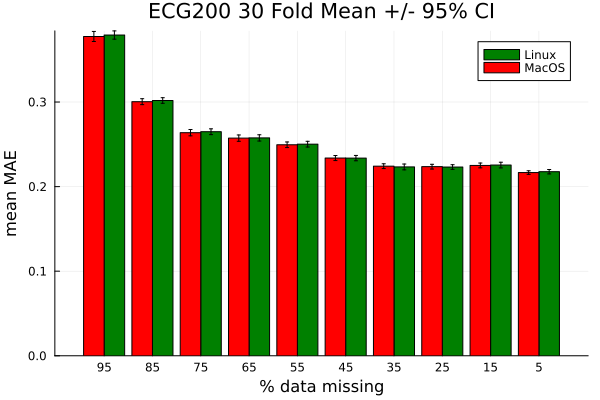

In [ ]:
# groupedbar([mps_per_pm_30fold_mean_lin mps_per_pm_30fold_mean],
#     yerr=[mps_per_pm_30fold_95ci_lin mps_per_pm_30fold_95ci],
#     markersize=2, 
#     legend=:topright,
#     bar_width=0.85,
#     xticks=([1, 2, 3, 4, 5, 6, 7, 8, 9, 10], 
#     ["5", "15", "25", "35", "45", "55", "65", "75", "85", "95"]),
#     label=["Linux" "MacOS"],
#     color=[:green :red],
#     title="ECG200 30 Fold Mean +/- 95% CI",
#     xlabel="% data missing",
#     ylabel="mean MAE")
# xflip!(true)
# #savefig("ecg200_30fold_linux_v_mac.svg")

Is there a statistically significant difference between the fold means for mac and linux?

In [ ]:
# using HypothesisTests

Collect the 30 fold results for each percentage missing

In [ ]:
# mac_30_fold_means = [[mean([mean(mps_results[pm][f][inst]) for inst in 1:100]) for f in 1:30] for pm in 1:10];
# linux_30_fold_means = [[mean([mean(mps_results_lin[pm][f][inst]) for inst in 1:100]) for f in 1:30] for pm in 1:10];

Shapiro-Wilk test for normality of the differences - Null hypothesis is that the data (difference vector) comes from a normal distribution

In [ ]:
# for pm in 1:10
#     diffs_pm = mac_30_fold_means[pm] .- linux_30_fold_means[pm]
#     swt = ShapiroWilkTest(diffs_pm)
#     println(swt)
# end

Shapiro-Wilk normality test
---------------------------
Population details:
    parameter of interest:   Squared correlation of data and expected order statistics of N(0,1) (W)
    value under h_0:         1.0
    point estimate:          0.954308

Test summary:
    outcome with 95% confidence: fail to reject h_0
    one-sided p-value:           0.2202

Details:
    number of observations: 30
    censored ratio:         0.0
    W-statistic:            0.954308

Shapiro-Wilk normality test
---------------------------
Population details:
    parameter of interest:   Squared correlation of data and expected order statistics of N(0,1) (W)
    value under h_0:         1.0
    point estimate:          0.982555

Test summary:
    outcome with 95% confidence: fail to reject h_0
    one-sided p-value:           0.8887

Details:
    number of observations: 30
    censored ratio:         0.0
    W-statistic:            0.982555

Shapiro-Wilk normality test
---------------------------
Population d

Perform paired t-test since data are normally distributed. Null hypothesis is that the diffrence between folds for each of the 30 folds (for any given percentage missing) comes from a distribution with mean 0 (i.e. no difference between platforms).

In [ ]:
# for pm in 1:10
#     ostt = OneSampleTTest(mac_30_fold_means[pm], linux_30_fold_means[pm])
#     println(ostt)
# end

One sample t-test
-----------------
Population details:
    parameter of interest:   Mean
    value under h_0:         0
    point estimate:          -0.00105466
    95% confidence interval: (-0.00263, 0.000521)

Test summary:
    outcome with 95% confidence: fail to reject h_0
    two-sided p-value:           0.1815

Details:
    number of observations:   30
    t-statistic:              -1.3689913994465759
    degrees of freedom:       29
    empirical standard error: 0.0007703902194203498

One sample t-test
-----------------
Population details:
    parameter of interest:   Mean
    value under h_0:         0
    point estimate:          -0.000433096
    95% confidence interval: (-0.001792, 0.0009255)

Test summary:
    outcome with 95% confidence: fail to reject h_0
    two-sided p-value:           0.5195

Details:
    number of observations:   30
    t-statistic:              -0.6519972049394609
    degrees of freedom:       29
    empirical standard error: 0.0006642600735538352

O

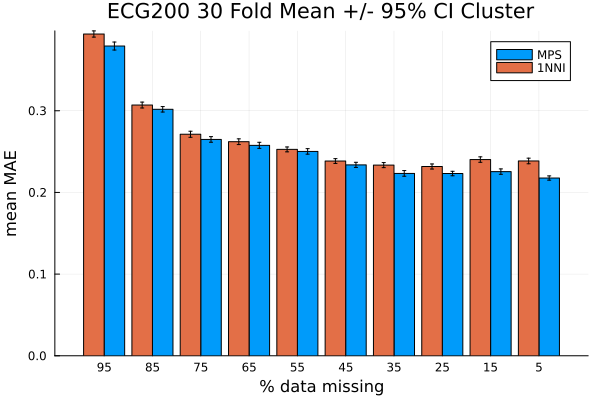

In [ ]:
# groupedbar([mps_per_pm_30fold_mean_lin nn_per_pm_30fold_mean_lin],
#     yerr=[mps_per_pm_30fold_95ci_lin nn_per_pm_30fold_95ci_lin],
#     markersize=2, 
#     legend=:topright,
#     bar_width=0.85,
#     xticks=([1, 2, 3, 4, 5, 6, 7, 8, 9, 10], 
#     ["5", "15", "25", "35", "45", "55", "65", "75", "85", "95"]),
#     label=["MPS" "1NNI"], 
#     title="ECG200 30 Fold Mean +/- 95% CI Cluster",
#     xlabel="% data missing",
#     ylabel="mean MAE")
# xflip!(true)
# #savefig("ecg200_30fold_mps_1nn_impute_cluster.svg")

Combine with state-of-the-art method results

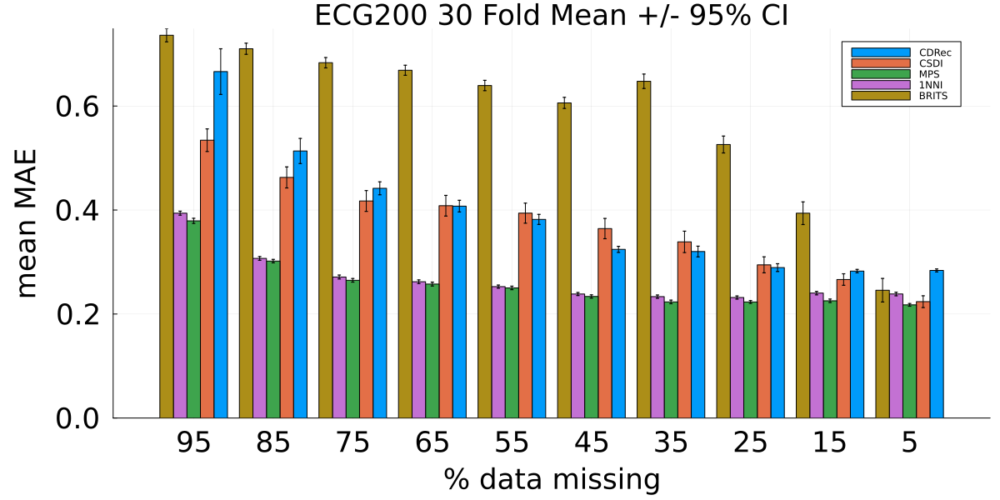

In [ ]:
# fstyle = font("sans-serif", 23)
# groupedbar([cdrec_mean_per_pm csdi_mean_per_pm mps_per_pm_30fold_mean_lin nn_per_pm_30fold_mean_lin brits_mean_per_pm],
#     yerr=[cdrec_ci95_per_pm csdi_ci95_per_pm mps_per_pm_30fold_95ci_lin nn_per_pm_30fold_95ci_lin brits_ci95_per_pm],
#     markersize=2, 
#     legend=:topright,
#     bar_width=0.85,
#     xticks=([1, 2, 3, 4, 5, 6, 7, 8, 9, 10], 
#     ["5", "15", "25", "35", "45", "55", "65", "75", "85", "95"]),
#     label=["CDRec" "CSDI" "MPS" "1NNI" "BRITS"], 
#     title="ECG200 30 Fold Mean +/- 95% CI",
#     xlabel="% data missing",
#     ylabel="mean MAE",
#     xtickfont=fstyle,
#     ytickfont=fstyle,
#     guidefont=fstyle,
#     titlefont=fstyle,
#     size=(1200, 600),
#     bottom_margin=10mm,
#     left_margin=10mm)
# xflip!(true)
# #savefig("ecg200_30fold_imputation_all_imputers.svg")

In [63]:
f = jldopen("ECG200_ImputationFinalResults_30Fold.jld2", "r");
mac_results_mps = read(f, "mps_results")
mac_results_nn = read(f, "nn_results")
close(f)

In [64]:
instances = length(mac_results_mps[5][1])
mps_per_pm_30fold_mean = [mean([mean([mean(mac_results_mps[pm][f][inst]) for inst in 1:instances]) for f in 1:30]) for pm in 1:10]
nn_per_pm_30fold_mean = [mean([mean([mean(mac_results_nn[pm][f][inst]) for inst in 1:instances]) for f in 1:30]) for pm in 1:10]
mps_per_pm_30fold_std_err = ([std([mean([mean(mac_results_mps[pm][f][inst]) for inst in 1:instances]) for f in 1:30]) for pm in 1:10]/sqrt(30))
nn_per_pm_30fold_std_err = ([std([mean([mean(mac_results_nn[pm][f][inst]) for inst in 1:instances]) for f in 1:30]) for pm in 1:10]/sqrt(30))
mps_per_pm_30fold_95ci = 1.96 * mps_per_pm_30fold_std_err;
nn_per_pm_30fold_95ci = 1.96 * nn_per_pm_30fold_std_err;

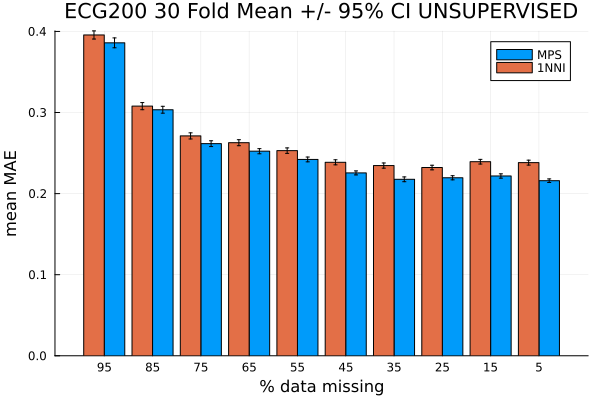

In [65]:
groupedbar([mps_per_pm_30fold_mean nn_per_pm_30fold_mean],
    yerr=[mps_per_pm_30fold_95ci nn_per_pm_30fold_95ci],
    markersize=2, 
    legend=:topright,
    bar_width=0.85,
    xticks=([1, 2, 3, 4, 5, 6, 7, 8, 9, 10], 
    ["5", "15", "25", "35", "45", "55", "65", "75", "85", "95"]),
    label=["MPS" "1NNI"], 
    title="ECG200 30 Fold Mean +/- 95% CI UNSUPERVISED",
    xlabel="% data missing",
    ylabel="mean MAE")
xflip!(true)

In [30]:
# CDREC CSDI MPS 1NNI BRITS
group_colours = [pal[10] pal[3] pal[4] pal[2] pal[5]]

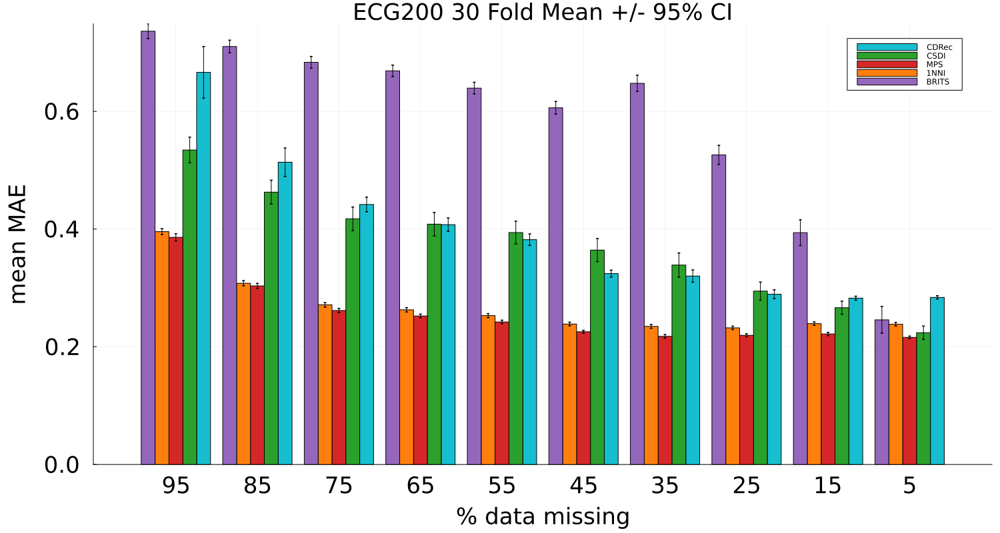

In [66]:
fstyle = font("sans-serif", 23)
groupedbar([cdrec_mean_per_pm csdi_mean_per_pm mps_per_pm_30fold_mean nn_per_pm_30fold_mean brits_mean_per_pm],
    yerr=[cdrec_ci95_per_pm csdi_ci95_per_pm mps_per_pm_30fold_95ci nn_per_pm_30fold_95ci brits_ci95_per_pm],
    markersize=2, 
    legend=:topright,
    bar_width=0.85,
    xticks=([1, 2, 3, 4, 5, 6, 7, 8, 9, 10], 
    ["5", "15", "25", "35", "45", "55", "65", "75", "85", "95"]),
    label=["CDRec" "CSDI" "MPS" "1NNI" "BRITS"], 
    c=group_colours,
    title="ECG200 30 Fold Mean +/- 95% CI",
    xlabel="% data missing",
    ylabel="mean MAE",
    xtickfont=fstyle,
    ytickfont=fstyle,
    guidefont=fstyle,
    titlefont=fstyle,
    size=(1500, 800),
    bottom_margin=10mm,
    left_margin=10mm)
xflip!(true)
#savefig("ECG200_results_final.svg")

# BRISTI

In [31]:
ecg_britsi = JSON.parsefile("Python/ecg_britsi.json");
ecg_britsi_means = float.(ecg_britsi["means"])
ecg_britsi_stds = float.(ecg_britsi["stds"])
ecg_britsi_95cis = 1.96/sqrt(30) * ecg_britsi_stds

10-element Vector{Float64}:
 0.007411221794512178
 0.01845573435598336
 0.022572614897976993
 0.0270532723001722
 0.031636039629867045
 0.03812779948694006
 0.04887341765067568
 0.06723324611579932
 0.07864205510449826
 0.09028788616584413

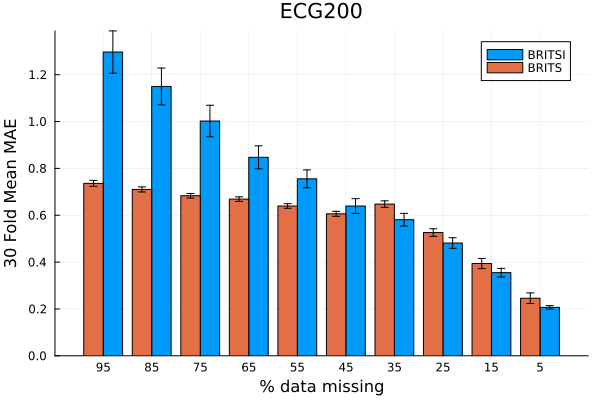

In [67]:
groupedbar([ecg_britsi_means brits_mean_per_pm],
    yerr=[ecg_britsi_95cis brits_ci95_per_pm],
    title="ECG200",
    xticks=([1, 2, 3, 4, 5, 6, 7, 8, 9, 10], 
    ["5", "15", "25", "35", "45", "55", "65", "75", "85", "95"]),
    label=["BRITSI" "BRITS"],
    xlabel="% data missing",
    ylabel="30 Fold Mean MAE",
    legend=:topright)
xflip!(true)
#savefig("ecg200_brits_v_britsi.svg")

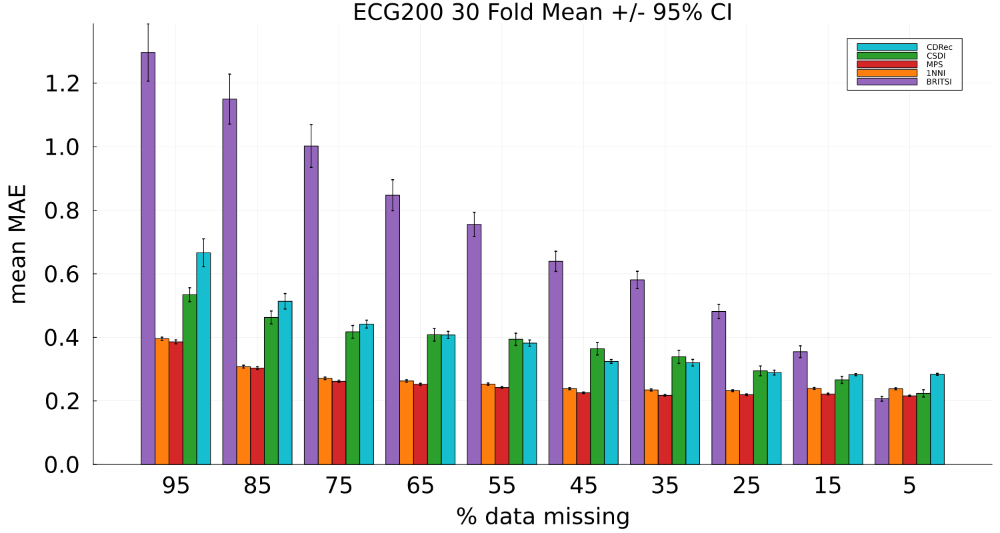

In [68]:
fstyle = font("sans-serif", 23)
groupedbar([cdrec_mean_per_pm csdi_mean_per_pm mps_per_pm_30fold_mean nn_per_pm_30fold_mean ecg_britsi_means],
    yerr=[cdrec_ci95_per_pm csdi_ci95_per_pm mps_per_pm_30fold_95ci nn_per_pm_30fold_95ci ecg_britsi_95cis],
    markersize=2, 
    legend=:topright,
    bar_width=0.85,
    xticks=([1, 2, 3, 4, 5, 6, 7, 8, 9, 10], 
    ["5", "15", "25", "35", "45", "55", "65", "75", "85", "95"]),
    label=["CDRec" "CSDI" "MPS" "1NNI" "BRITSI"], 
    c=group_colours,
    title="ECG200 30 Fold Mean +/- 95% CI",
    xlabel="% data missing",
    ylabel="mean MAE",
    xtickfont=fstyle,
    ytickfont=fstyle,
    guidefont=fstyle,
    titlefont=fstyle,
    size=(1500, 800),
    bottom_margin=10mm,
    left_margin=10mm)
xflip!(true)
#savefig("ECG200_results_final_wBRITSI.svg")

In [69]:
ecg_britsi

Dict{String, Any} with 3 entries:
  "stds"  => Any[0.0207107, 0.0515746, 0.0630792, 0.0756004, 0.088407, 0.106548…
  "pms"   => Any[5, 15, 25, 35, 45, 55, 65, 75, 85, 95]
  "means" => Any[0.206756, 0.354869, 0.481486, 0.580961, 0.63936, 0.755487, 0.8…

# MPS Hyperparam Opt Results

In [61]:
mps_hyperparm_opt = jldopen("ECG_hyperopt_res.jld2", "r");
mps_ho_means = read(mps_hyperparm_opt, "mmae_by_pm")
mps_ho_stds = read(mps_hyperparm_opt, "std_by_pm")[:, 1];
mps_hi_95ci = 1.96/sqrt(30) * mps_ho_stds

10-element Vector{Float64}:
 0.002598633200427452
 0.0032161714971114825
 0.003627657123829604
 0.005051276764319451
 0.005530969266082102
 0.006240840035296625
 0.006329990705729679
 0.005785830277223065
 0.006431142281976165
 0.00612126973426398

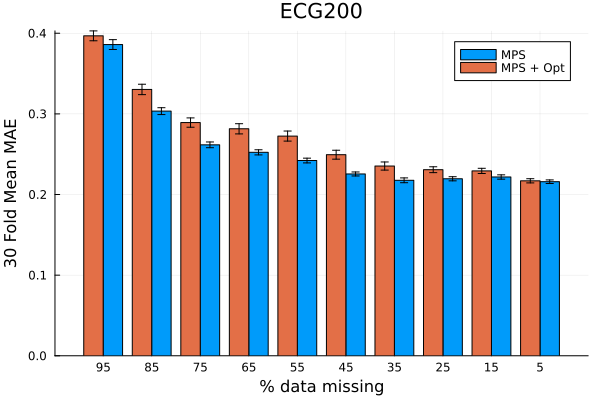

In [70]:
groupedbar([mps_per_pm_30fold_mean mps_ho_means],
    yerr=[mps_per_pm_30fold_95ci mps_hi_95ci],
    title="ECG200",
    markersize=4, 
    xticks=([1, 2, 3, 4, 5, 6, 7, 8, 9, 10], 
    ["5", "15", "25", "35", "45", "55", "65", "75", "85", "95"]),
    label=["MPS" "MPS + Opt"],
    xlabel="% data missing",
    ylabel="30 Fold Mean MAE",
    legend=:topright)
xflip!(true)
#savefig("ecg_mps_v_mpshopt.svg")

In [71]:
pm = collect(5:10:95);

In [ ]:
# ecg_results = Dict()
# res_mps = Dict()
# res_mps["pm"] = pm
# res_mps["means"] = mps_per_pm_30fold_mean
# res_mps["std_errors"] = mps_per_pm_30fold_std_err
# res_nn = Dict()
# res_nn["pm"] = pm 
# res_nn["means"] = nn_per_pm_30fold_mean
# res_nn["std_errors"] = nn_per_pm_30fold_std_err
# res_csdi = Dict()
# res_csdi["pm"] = pm
# res_csdi["means"] = csdi_mean_per_pm
# res_csdi["std_errors"] = csdi_std_err_per_pm
# res_brits = Dict()
# res_brits["pm"] = pm
# res_brits["means"] = brits_mean_per_pm
# res_brits["std_errors"] = brits_std_err_per_pm
# res_cdrec = Dict()
# res_cdrec["pm"] = pm
# res_cdrec["means"] = cdrec_mean_per_pm
# res_cdrec["std_errors"] = cdrec_std_err_per_pm
# ecg_results["mps"] = res_mps
# ecg_results["nn"] = res_nn
# ecg_results["brits"] = res_brits
# ecg_results["cdrec"] = res_cdrec
# ecg_results["csdi"] = res_csdi

Dict{Any, Any} with 3 entries:
  "std_errors" => [0.00577642, 0.00565422, 0.00784125, 0.010494, 0.00995118, 0.…
  "pm"         => [5, 15, 25, 35, 45, 55, 65, 75, 85, 95]
  "means"      => [0.2238, 0.266359, 0.294579, 0.338811, 0.364273, 0.394018, 0.…

In [ ]:
# JLD2.@save "ecg_results_paper.jld2" ecg_results

UndefVarError: UndefVarError: `ecg_results` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [43]:
ecg_res_paper_f = jldopen("ecg_results_paper.jld2")
ecg_res_paper = read(ecg_res_paper, "ecg_results")

Dict{Any, Any} with 5 entries:
  "cdrec" => Dict{Any, Any}("std_errors"=>[0.00144096, 0.00168092, 0.00380523, …
  "brits" => Dict{Any, Any}("std_errors"=>[0.0115565, 0.0111174, 0.00828522, 0.…
  "csdi"  => Dict{Any, Any}("std_errors"=>[0.00577642, 0.00565422, 0.00784125, …
  "nn"    => Dict{Any, Any}("std_errors"=>[0.00155875, 0.00147093, 0.00143852, …
  "mps"   => Dict{Any, Any}("std_errors"=>[0.00113103, 0.00136925, 0.00130358, …

In [48]:
ecg_res_paper["mps"]

Dict{Any, Any} with 3 entries:
  "std_errors" => [0.00113103, 0.00136925, 0.00130358, 0.00152399, 0.00126431, …
  "pm"         => [5, 15, 25, 35, 45, 55, 65, 75, 85, 95]
  "means"      => [0.215917, 0.221728, 0.219511, 0.217653, 0.225514, 0.242156, …

In [50]:
mps_per_pm_30fold_mean = ecg_res_paper["mps"]["means"]
mps_per_pm_30fold_std_err = ecg_res_paper["mps"]["std_errors"]
nn_per_pm_30fold_mean = ecg_res_paper["nn"]["means"]
nn_per_pm_30fold_std_err = ecg_res_paper["nn"]["std_errors"]
csdi_mean_per_pm = ecg_res_paper["csdi"]["means"]
csdi_std_err_per_pm = ecg_res_paper["csdi"]["std_errors"]
brits_mean_per_pm = ecg_res_paper["brits"]["means"]
brits_std_err_per_pm = ecg_res_paper["brits"]["std_errors"]
cdrec_mean_per_pm = ecg_res_paper["cdrec"]["means"]
cdrec_std_err_per_pm = ecg_res_paper["cdrec"]["std_errors"]

10-element Vector{Float64}:
 0.0014409569162078027
 0.00168091770452588
 0.0038052276110025645
 0.005277785662501452
 0.0029638317441760373
 0.004954029454368166
 0.005729021177327299
 0.006363160317534923
 0.0123198946069039
 0.022414456135970935

# new hyperparam opt results March 7

In [52]:
mps_hyper_new = jldopen("ECG_josh2.jld2");
mps_hyper_new_pms = read(mps_hyper_new, "pms")
mps_hyper_new_means = read(mps_hyper_new, "mmae_by_pms")
mps_hyper_new_stds = read(mps_hyper_new, "std_by_pms")[:, 1];

In [58]:
mps_per_pm_30fold_mean_new = mps_hyper_new_means
mps_per_pm_30fold_95ci_new = mps_hyper_new_stds * 1.96/sqrt(30)

10-element Vector{Float64}:
 0.00284289842219368
 0.002992975335049024
 0.0029117359205365345
 0.004072558838222927
 0.004433680257954448
 0.004690469453817827
 0.0045892873139632435
 0.004165372354648517
 0.004264974884400159
 0.005146361544476333

In [59]:
mps_per_pm_30fold_mean

10-element Vector{Float64}:
 0.21591736377694942
 0.2217279913071334
 0.21951063164134696
 0.2176528902736345
 0.2255143067419267
 0.2421556717142465
 0.2523117953428755
 0.2615845203817129
 0.3034220573446341
 0.38593348786089804

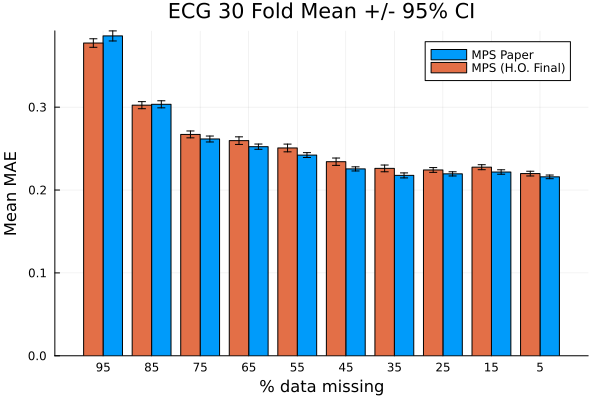

In [72]:
groupedbar([mps_per_pm_30fold_mean mps_per_pm_30fold_mean_new], 
    yerr=[mps_per_pm_30fold_95ci mps_per_pm_30fold_95ci_new],
    legend=:topright, 
    xticks=([1, 2, 3, 4, 5, 6, 7, 8, 9, 10], 
    ["5", "15", "25", "35", "45", "55", "65", "75", "85", "95"]),
    label=["MPS Paper" "MPS (H.O. Final)"], 
    title="ECG 30 Fold Mean +/- 95% CI",
    xlabel="% data missing",
    ylabel="Mean MAE")
xflip!(true)

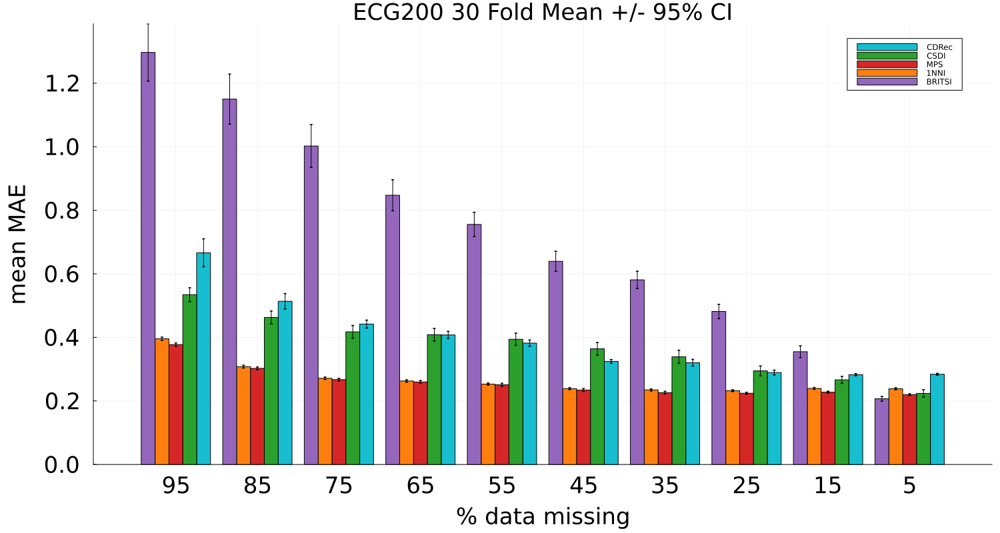

In [73]:
fstyle = font("sans-serif", 23)
groupedbar([cdrec_mean_per_pm csdi_mean_per_pm mps_per_pm_30fold_mean_new nn_per_pm_30fold_mean ecg_britsi_means],
    yerr=[cdrec_ci95_per_pm csdi_ci95_per_pm mps_per_pm_30fold_95ci_new nn_per_pm_30fold_95ci ecg_britsi_95cis],
    markersize=2, 
    legend=:topright,
    bar_width=0.85,
    xticks=([1, 2, 3, 4, 5, 6, 7, 8, 9, 10], 
    ["5", "15", "25", "35", "45", "55", "65", "75", "85", "95"]),
    label=["CDRec" "CSDI" "MPS" "1NNI" "BRITSI"], 
    c=group_colours,
    title="ECG200 30 Fold Mean +/- 95% CI",
    xlabel="% data missing",
    ylabel="mean MAE",
    xtickfont=fstyle,
    ytickfont=fstyle,
    guidefont=fstyle,
    titlefont=fstyle,
    size=(1500, 800),
    bottom_margin=10mm,
    left_margin=10mm)
xflip!(true)
#savefig("ECG200_results_final_wBRITSI_and_mps_hopt_final.svg")

# New hyperparm opt results (FINAL) March 24

In [74]:
mps_hyper_final = jldopen("ECG_250.jld2")
mps_hyper_final_pms = read(mps_hyper_final, "pms")
mps_hyper_final_means = read(mps_hyper_final, "mmae_by_pms")
mps_hyper_final_stds = read(mps_hyper_final, "std_by_pms")[:, 1]
mps_hyper_final_95ci = 1.96/sqrt(30) * mps_hyper_final_stds

10-element Vector{Float64}:
 0.002648972934175478
 0.0027799224878829
 0.0026371657226131255
 0.0030711010036141248
 0.002906444912315915
 0.0029802634667650996
 0.003430108740034955
 0.003634416419911688
 0.0046999471403187535
 0.0063636027993403035

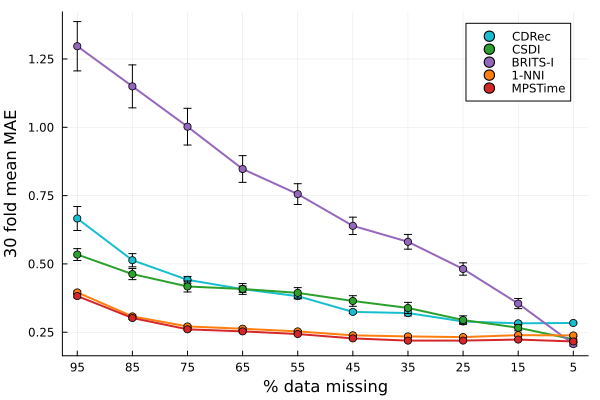

In [75]:
plot(cdrec_mean_per_pm, c=group_colours[1], legend=:topright, lw=2, label="")
scatter!(cdrec_mean_per_pm, label="CDRec", c=group_colours[1], legend=:topright, yerr=cdrec_ci95_per_pm, xticks=([1, 2, 3, 4, 5, 6, 7, 8, 9, 10], 
    ["5", "15", "25", "35", "45", "55", "65", "75", "85", "95"]))
plot!(csdi_mean_per_pm, c=group_colours[2], lw=2, label="")
scatter!(csdi_mean_per_pm, c=group_colours[2], label="CSDI", yerr=csdi_ci95_per_pm)
plot!(ecg_britsi_means, c=group_colours[5], lw=2, label="")
scatter!(ecg_britsi_means, c=group_colours[5], label="BRITS-I", yerr=ecg_britsi_95cis)
plot!(nn_per_pm_30fold_mean, c=group_colours[4], lw=2, label="")
scatter!(nn_per_pm_30fold_mean, c=group_colours[4], label="1-NNI", yerr=nn_per_pm_30fold_95ci)
plot!(mps_hyper_final_means, c=group_colours[3], lw=2, label="")
scatter!(mps_hyper_final_means, c=group_colours[3], label="MPSTime", yerr=mps_hyper_final_95ci)
xlabel!("% data missing")
ylabel!("30 fold mean MAE")
xflip!(true)

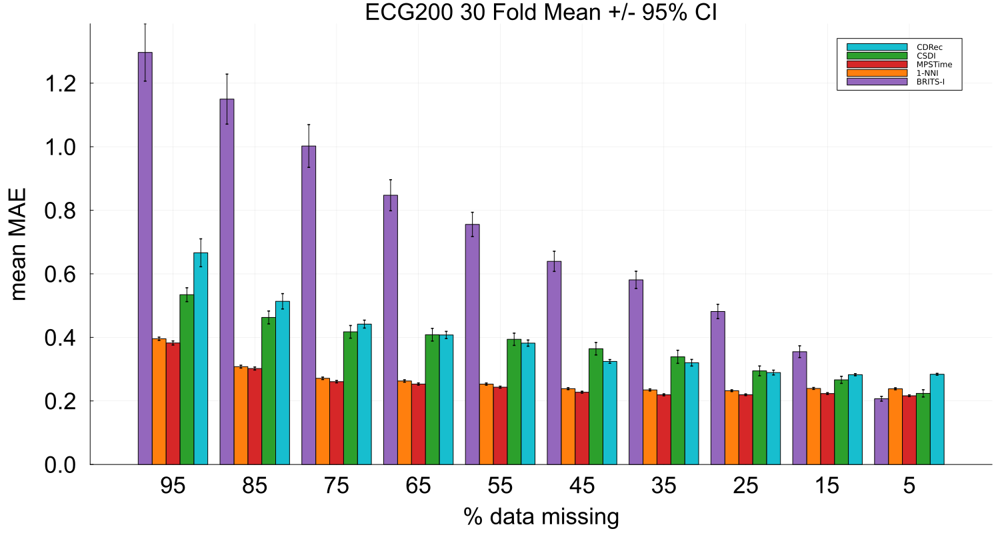

In [76]:
fstyle = font("Arial", 23)
groupedbar([cdrec_mean_per_pm csdi_mean_per_pm mps_hyper_final_means nn_per_pm_30fold_mean ecg_britsi_means],
    yerr=[cdrec_ci95_per_pm csdi_ci95_per_pm mps_hyper_final_95ci nn_per_pm_30fold_95ci ecg_britsi_95cis],
    markersize=2, 
    legend=:topright,
    bar_width=0.85,
    xticks=([1, 2, 3, 4, 5, 6, 7, 8, 9, 10], 
    ["5", "15", "25", "35", "45", "55", "65", "75", "85", "95"]),
    label=["CDRec" "CSDI" "MPSTime" "1-NNI" "BRITS-I"], 
    c=group_colours,
    title="ECG200 30 Fold Mean +/- 95% CI",
    xlabel="% data missing",
    ylabel="mean MAE",
    xtickfont=fstyle,
    ytickfont=fstyle,
    guidefont=fstyle,
    titlefont=fstyle,
    size=(1500, 800),
    bottom_margin=10mm,
    left_margin=10mm)
xflip!(true)
#savefig("ECG200_imputation_paper.svg")